# Plot Department of Ecology compliance regions

In [1]:
import sys
import os
sys.path.insert(1, '../scripts/')
import xarray
import openpyxl
import contextily as cx 
import yaml
import numpy as np
import pandas
import pathlib
import time
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl

In [2]:
with open('../../etc/SSM_config_whidbey.yaml', 'r') as file:
    ssm = yaml.safe_load(file)
# get shapefile path    
shp = ssm['paths']['shapefile']
# load shapefile into geopandas dataframe
gdf = gpd.read_file(shp)

# output_directory = pathlib.Path(
#     ssm['paths']['graphics']
# )/'Maps'
output_directory = pathlib.Path('/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/projects/KingCounty/reports')

In [3]:
#import xlrd
nutrient_xlsx = '/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/projects/KingCounty/SalishSeaModel-analysis/spreadsheets/ssm_pnt_wq_station_info.xlsx'
loading_nodes=pandas.read_excel(
    nutrient_xlsx,
    sheet_name='Sheet1'
)

### list the basin names (Bounding scenarios?)

In [4]:
loading_nodes[['basin','country']].groupby('basin').count().index.tolist()

['  Admiralty',
 '  Commencement_Bay',
 '  Elliott_Bay',
 '  Fraser',
 '  Hood_Canal',
 '  Puget_Main',
 '  SJF',
 '  SOG',
 '  SOG_Canada',
 '  Sinclair_Dyes',
 '  South_Sound',
 '  Vanc_Island_South',
 '  Whidbey']

In [5]:
[*loading_nodes]

['Unnamed: 0',
 'type',
 'node_id',
 'layer_distribute',
 'basin',
 'country',
 'NH4[kg/year]',
 'NO3NO2[kg/year]',
 'N-load']

In [6]:
do_std_df=gdf[['region_inf','node_id']].groupby('region_inf').count().rename(columns={'node_id':'Node Count'})
do_std_df

,Node Count
region_inf,
Hood,401
Main,893
Other,29
SJF_Admiralty,774
SOG_Bellingham,488
South_Sound,1028
Whidbey,531


In [7]:
regions=gdf[['region_inf','node_id']].groupby('region_inf').count().index.to_list()
regions.remove("Other")
regions

['Hood', 'Main', 'SJF_Admiralty', 'SOG_Bellingham', 'South_Sound', 'Whidbey']

In [8]:
color_dict = {'Hood': 'darkseagreen',
 'Main': 'mediumpurple',
 'SJF_Admiralty': 'lightsteelblue',
 'SOG_Bellingham': 'rosybrown',
 'South_Sound': 'c',
 'Whidbey': 'cornflowerblue'}

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

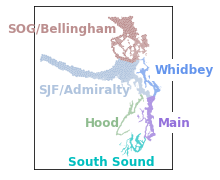

In [42]:
fig_title = f"Optimization Scenario Regions"
graphics_name = f"Regions.png"
# plot differences for each run
fig, axs = plt.subplots(1,1, figsize = (8,6))
for region in regions:
    gdf_region=gdf.loc[gdf['region_inf']==region]
    gdf_region.plot('region_inf',ax=axs, color=ssm['region']['colors'][region],legend=False) 
# cx.add_basemap(axs, crs=gdf.crs, 
#             source=cx.providers.Stamen.TerrainBackground, 
#             alpha=0.5) 
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.axis("off")
#axs.set_title(fig_title)(-
axs.set_xticklabels('')
axs.set_yticklabels('')
plt.xticks([]) 
plt.yticks([]) 
axs.set_ylim(5.92e6, 6.3e6)
axs.set_xlim(-1.39e7,-1.358e7)
# Add region labels
axs.text(0.6, 0.825, 'SOG/Bellingham',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['SOG_Bellingham'], fontsize=12)
axs.text(0.7, 0.45, 'SJF/Admiralty',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['SJF_Admiralty'], fontsize=12)
axs.text(0.625, 0.25, 'Hood',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['Hood'], fontsize=12)
axs.text(0.9, 0.25, 'Main',
        verticalalignment='bottom', horizontalalignment='left',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['Main'], bbox ={'facecolor':'white','edgecolor':'white'}, fontsize=12)
axs.text(0.875, 0.01, 'South Sound',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['South_Sound'], fontsize=12)
axs.text(0.884, 0.57, 'Whidbey',
        verticalalignment='bottom', horizontalalignment='left',
        transform=axs.transAxes, fontweight="bold",
        color=ssm['region']['colors']['Whidbey'], bbox ={'facecolor':'white','edgecolor':'white'},fontsize=12)
output_file = output_directory/f"NodeMap_All_ECYcolors.png"

plt.gcf().set_size_inches(4, 3)
plt.savefig(output_file, bbox_inches='tight', format='png', dpi=600, width=4, height=3)

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

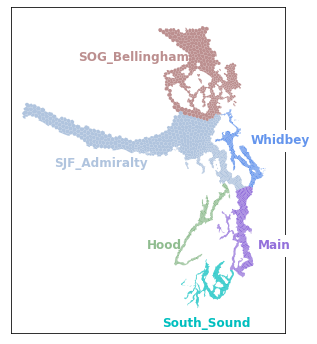

In [10]:
fig_title = f"Optimization Scenario Regions"
graphics_name = f"Regions.png"
# plot differences for each run
fig, axs = plt.subplots(1,1, figsize = (8,6))
for region in regions:
    gdf_region=gdf.loc[gdf['region_inf']==region]
    gdf_region.plot('region_inf',ax=axs, color=ssm['region']['colors'][region],legend=False) 
# cx.add_basemap(axs, crs=gdf.crs, 
#             source=cx.providers.Stamen.TerrainBackground, 
#             alpha=0.5) 
#plt.legend(bbox_to_anchor=(1.0, 1.0))
#plt.axis("off")
#axs.set_title(fig_title)(-
axs.set_xticklabels('')
axs.set_yticklabels('')
plt.xticks([]) 
plt.yticks([]) 
axs.set_ylim(5.92e6, 6.3e6)
axs.set_xlim(-1.39e7,-1.358e7)
# Add region labels
axs.text(0.65, 0.825, 'SOG_Bellingham',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['SOG_Bellingham'], fontsize=12)

axs.text(0.5, 0.5, 'SJF_Admiralty',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['SJF_Admiralty'], fontsize=12)
axs.text(0.625, 0.25, 'Hood',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['Hood'], fontsize=12)
axs.text(0.9, 0.25, 'Main',
        verticalalignment='bottom', horizontalalignment='left',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['Main'], bbox ={'facecolor':'white','edgecolor':'white'}, fontsize=12)
axs.text(0.875, 0.01, 'South_Sound',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,fontweight="bold",
        color=ssm['region']['colors']['South_Sound'], fontsize=12)
axs.text(0.874, 0.57, 'Whidbey',
        verticalalignment='bottom', horizontalalignment='left',
        transform=axs.transAxes, fontweight="bold",
        color=ssm['region']['colors']['Whidbey'], bbox ={'facecolor':'white','edgecolor':'white'},fontsize=12)
output_file = output_directory/f"NodeMap_All_ECYcolors.png"

plt.savefig(output_file, bbox_inches='tight', format='png', dpi=1000)

In [11]:
output_directory

PosixPath('/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/projects/KingCounty/reports')

# Plot WWTP and river nodes in each region
The list of Basins is: 
    ['  Admiralty',
 '  Commencement_Bay',
 '  Elliott_Bay',
 '  Fraser',
 '  Hood_Canal',
 '  Puget_Main',
 '  SJF',
 '  SOG',
 '  SOG_Canada',
 '  Sinclair_Dyes',
 '  South_Sound',
 '  Vanc_Island_South',
 '  Whidbey']

### Get the Whidbey node IDs from "ssm_pnt_wq_station_info.xlsx"

In [12]:
case = '  Whidbey'
case_nodes = loading_nodes[
    loading_nodes['basin']== case
]

In [13]:
case_nodes[['type','node_id']].groupby('type').count().index.to_list()

[' Point Source', ' River']

In [14]:
river_nodes = case_nodes[case_nodes["type"]==" River"]
wwtp_nodes = case_nodes[case_nodes["type"]==" Point Source"]

In [15]:
river_nodes

,Unnamed: 0,type,node_id,layer_distribute,basin,country,NH4[kg/year],NO3NO2[kg/year],N-load
124,Skagit R_1,River,12754,Power law,Whidbey,United States,111598.985218,1.104199e+06,1.215798e+06
125,Skagit R_2,River,12755,Power law,Whidbey,United States,111598.985218,1.104199e+06,1.215798e+06
126,Snohomish R_1,River,15140,Power law,Whidbey,United States,73523.308608,1.297124e+06,1.370647e+06
127,Snohomish R_2,River,15141,Power law,Whidbey,United States,73523.308608,1.297124e+06,1.370647e+06
128,Stillaguamish R_1,River,13226,Power law,Whidbey,United States,27611.176999,5.445752e+05,5.721863e+05
129,Stillaguamish R_2,River,13282,Power law,Whidbey,United States,27611.176999,5.445752e+05,5.721863e+05
130,Whidbey east,River,8408,Surface3,Whidbey,United States,1559.720374,7.030620e+04,7.186592e+04


### Use the node IDs from above to select geometry from geodataframe

In [16]:
gdf_wwtp = gdf[gdf.tce.isin(wwtp_nodes.node_id.to_list())].set_index('tce') 
gdf_rivers = gdf[gdf.tce.isin(river_nodes.node_id.to_list())].set_index('tce') 
# make list of names for rivers and wwtps
wwtp_names=wwtp_nodes['Unnamed: 0'].tolist()
river_names=river_nodes['Unnamed: 0'].tolist()

In [17]:
river_nodes[river_nodes['node_id']==8408]['Unnamed: 0'].item()[2:]

'Whidbey east'

## gdf_rivers

In [19]:
output_directory

PosixPath('/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/projects/KingCounty/reports')

Swinomish
La Conner
Oak Harbor Lagoon
Mukilteo
Oak Harbor RBC
Penn Cove
Coupeville
OF100
Kimberly_Clark
Langley
Tulalip
Stanwood
Warm Beach Campground
Marysville
Skagit County 2 Big Lake
Everett Snohomish
Mt Vernon
Lake Stevens 001
Lake Stevens 002
Snohomish


findfont: Font family ['arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['arial'] not found. Falling back to DejaVu Sans.


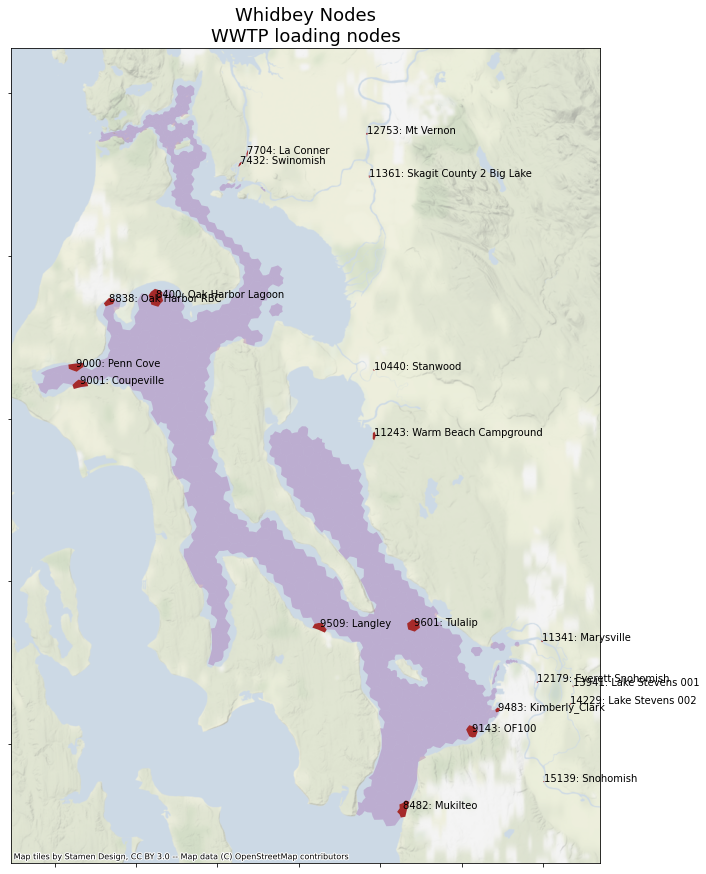

8408: Whidbey east
12754: Skagit R_1
12755: Skagit R_2
13226: Stillaguamish R_1
13282: Stillaguamish R_2
15140: Snohomish R_1
15141: Snohomish R_2


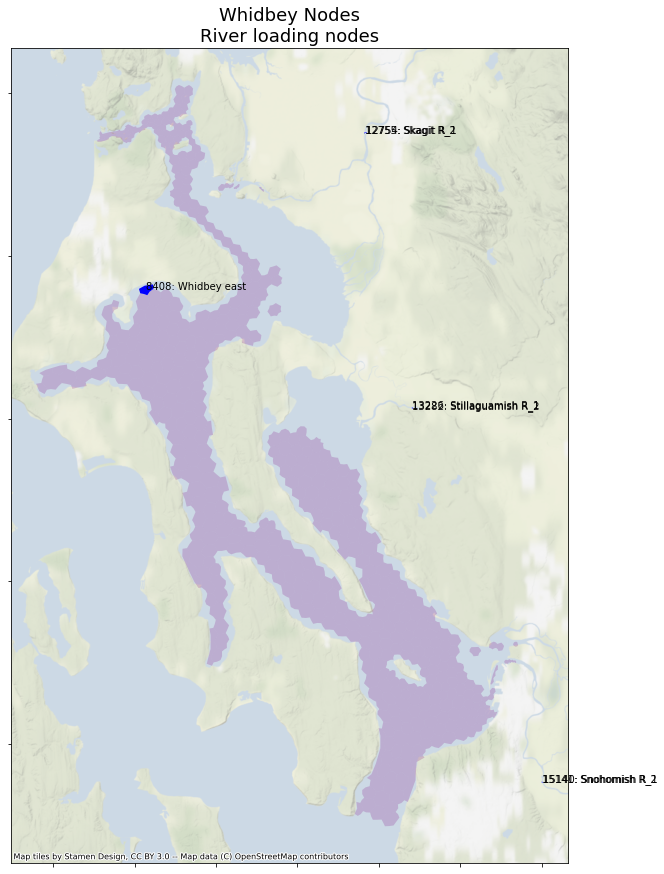

In [20]:
import itertools
from matplotlib.offsetbox import AnchoredText

for pidx in [0,1]:
    fig, axs = plt.subplots(1,1, figsize = (15,15))   
    fig_title = f"{region} Nodes"
    gdf_region=gdf.loc[gdf['region_inf']==region]
    gdf_region.plot(ax=axs, color='purple',label=region,alpha=0.2) 
    if pidx==0:
        name_index=0
        for idx, row in gdf_wwtp.iterrows():
            wwtp_name = wwtp_nodes[wwtp_nodes['node_id']==idx]['Unnamed: 0'].item()[2:]
            print(wwtp_name)
            gdf_wwtp.loc[[idx],'geometry'].plot(
                ax=axs,
                color='brown')
            plt.annotate(f"{idx}: {wwtp_name}", xy=(gdf_wwtp.loc[idx].geometry.centroid.x,gdf_wwtp.loc[idx].geometry.centroid.y),
                 horizontalalignment='left')
            name_index+=1
        axs.set_title(f"{region} Nodes\nWWTP loading nodes", fontsize=18)
        output_file = output_directory/f"NodeMap_{region}_WWTP_sources.png"   
    else:
        name_index=0
        for idx, row in gdf_rivers.iterrows(): 
            river_name = river_nodes[river_nodes['node_id']==idx]['Unnamed: 0'].item()[2:]
            print(f"{idx}: {river_name}")
            gdf_rivers.loc[[idx],'geometry'].plot(
                ax=axs,
                color='blue',#color[idx],
                label=river_names[name_index])
            plt.annotate(f"{idx}: {river_name}", xy=(gdf_rivers.loc[idx].geometry.centroid.x,gdf_rivers.loc[idx].geometry.centroid.y),
                 horizontalalignment='left')
            name_index+=1
        axs.set_title(f"{region} Nodes\nRiver loading nodes", fontsize=18)
        output_file = output_directory/f"NodeMap_{region}_River_sources.png"    
    cx.add_basemap(axs, crs=gdf.crs, 
       source=cx.providers.Stamen.TerrainBackground, 
       alpha=0.5) 
    axs.set_xticklabels('')
    axs.set_yticklabels('')
    plt.savefig(output_file, bbox_inches='tight', format='png')
    plt.show()

# plot one graphic per region

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

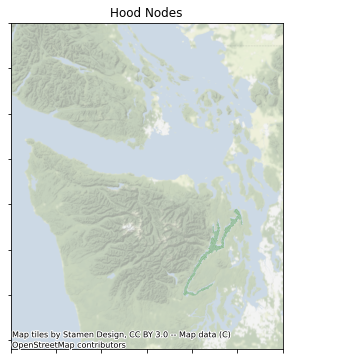

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

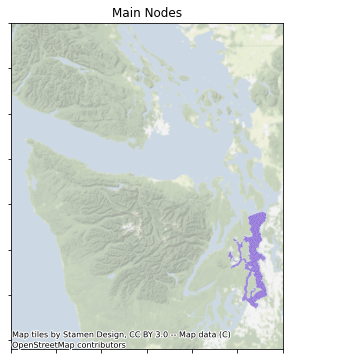

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

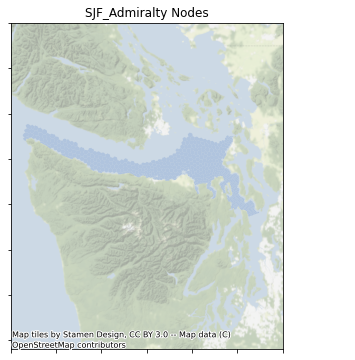

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

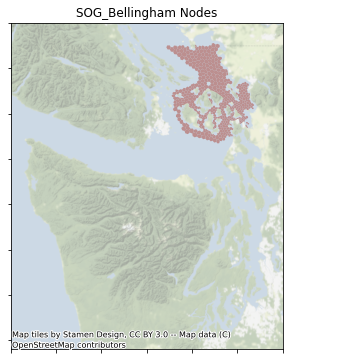

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

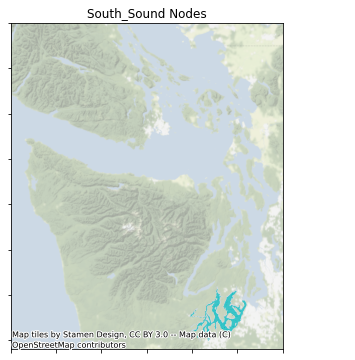

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

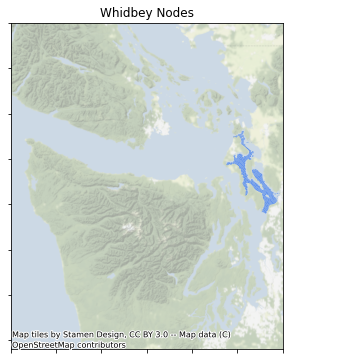

In [21]:
# plot differences for each run
for region in regions:
    fig, axs = plt.subplots(1,1, figsize = (8,6))   
    
    for region_extent in regions:
        gdf_region=gdf.loc[gdf['region_inf']==region_extent]
        gdf_region.plot('region_inf',ax=axs, color=ssm['region']['colors'][region_extent],alpha=0) 

    fig_title = f"{region} Nodes"
    gdf_region=gdf.loc[gdf['region_inf']==region]
    gdf_region.plot('region_inf',ax=axs, color=ssm['region']['colors'][region],label=region,legend=True) 
    cx.add_basemap(axs, crs=gdf.crs, 
       source=cx.providers.Stamen.TerrainBackground, 
       alpha=0.5) 
    axs.set_title(fig_title)
    axs.set_xlim(-1.390e7, -1.360e7)
    axs.set_ylim(5.94e6, 6.3e6)
    axs.set_xticklabels('')
    axs.set_yticklabels('')
    output_file = output_directory/f"NodeMap_{region}.png"
    plt.savefig(output_file, bbox_inches='tight', format='png')
    plt.show()


### Repeat the above graphics with same color

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

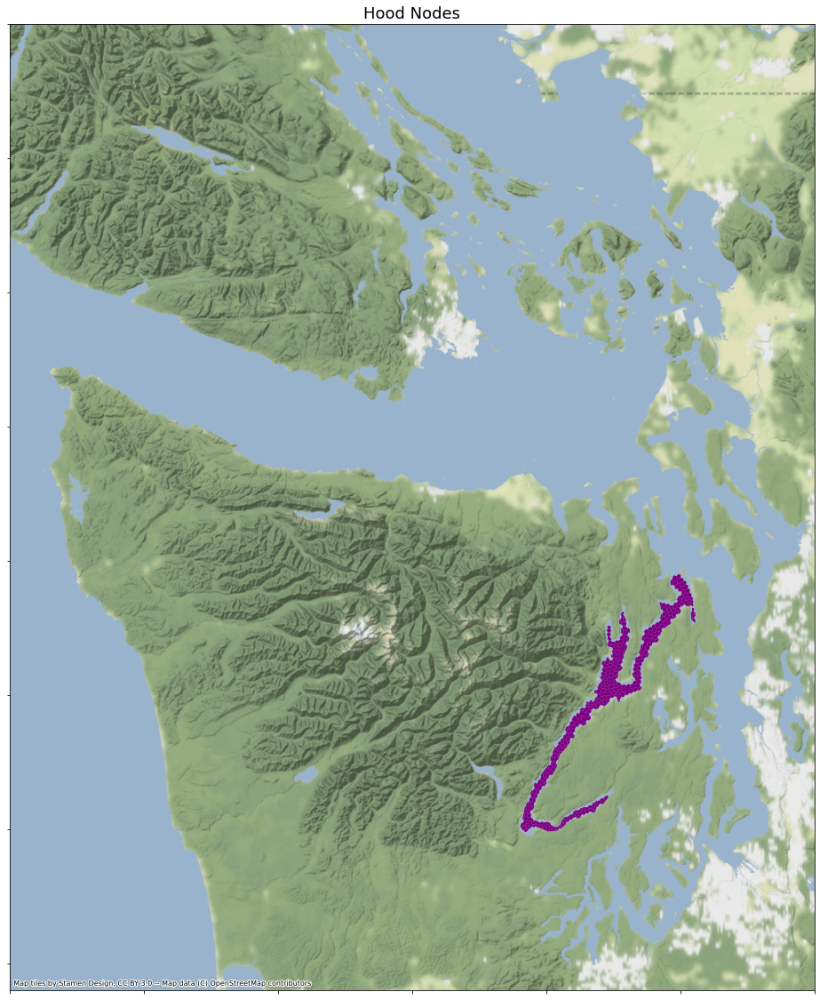

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

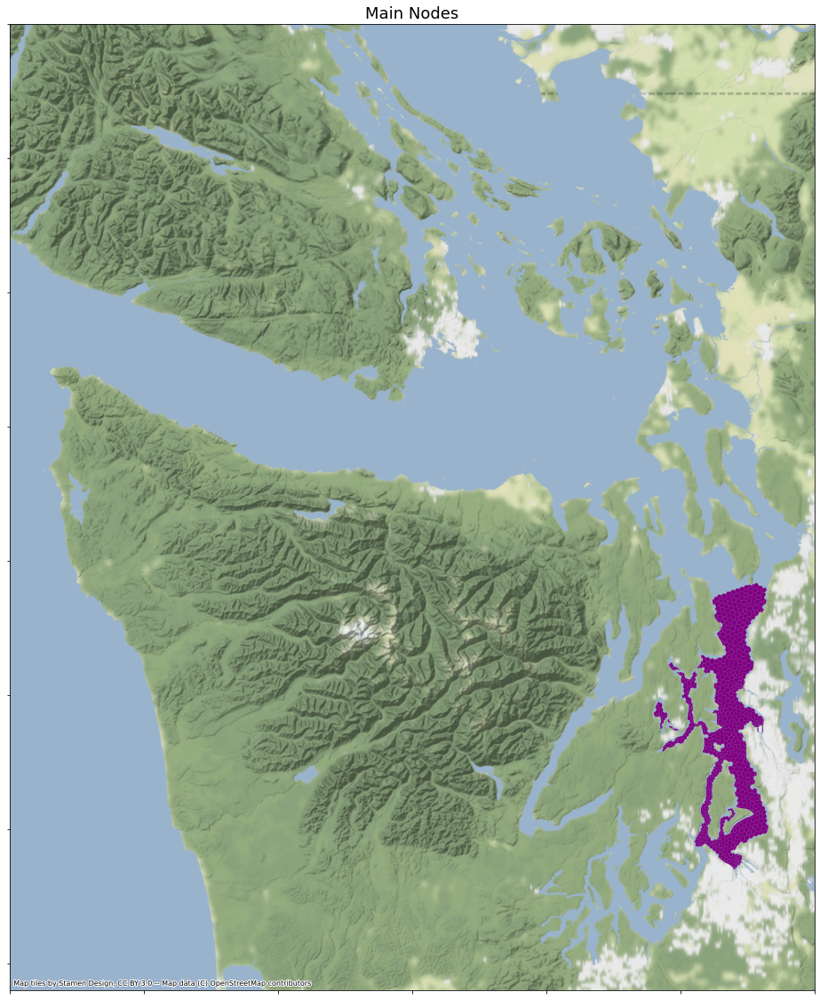

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

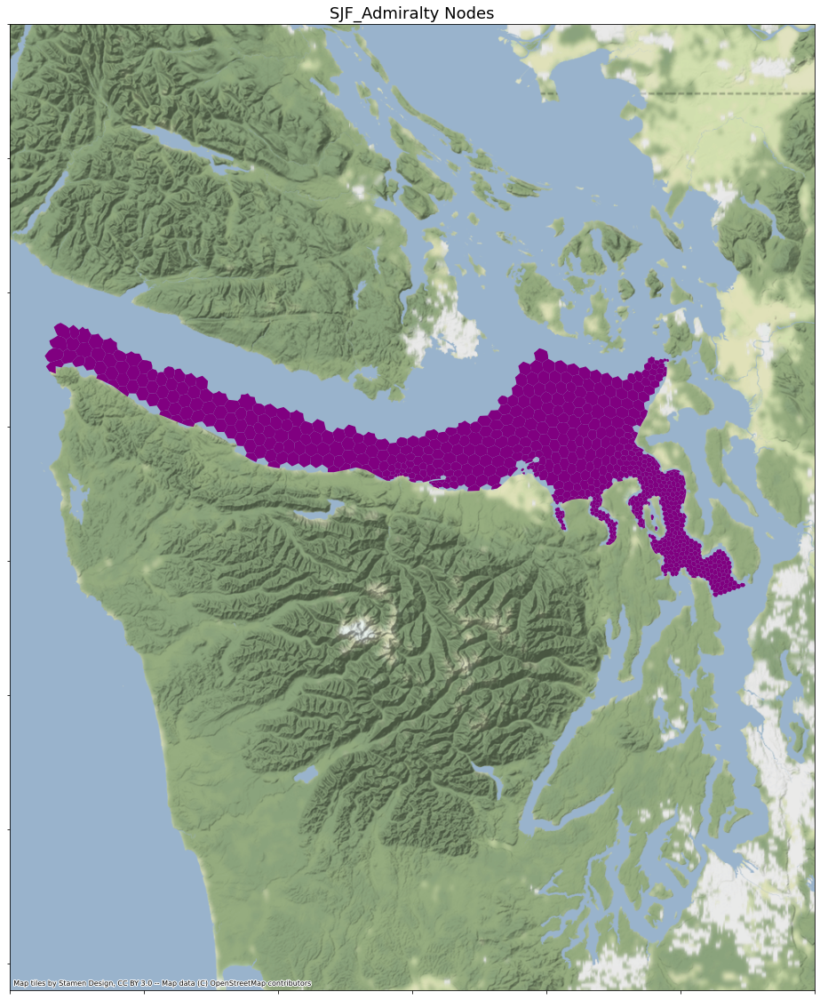

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

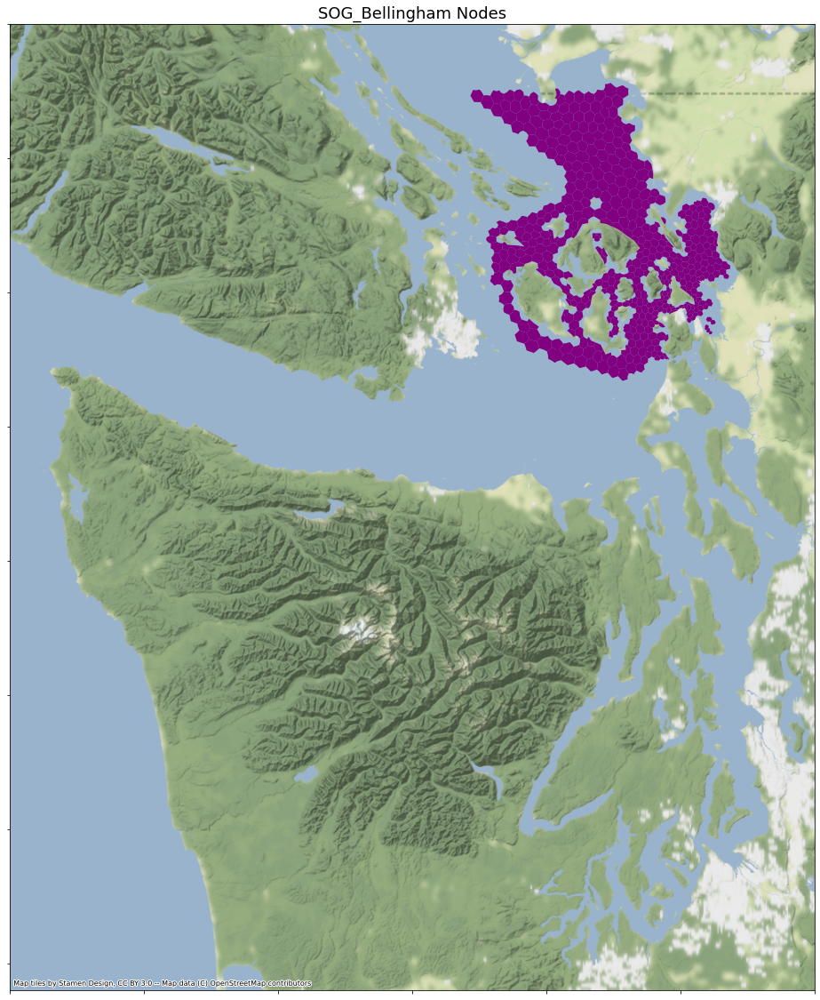

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

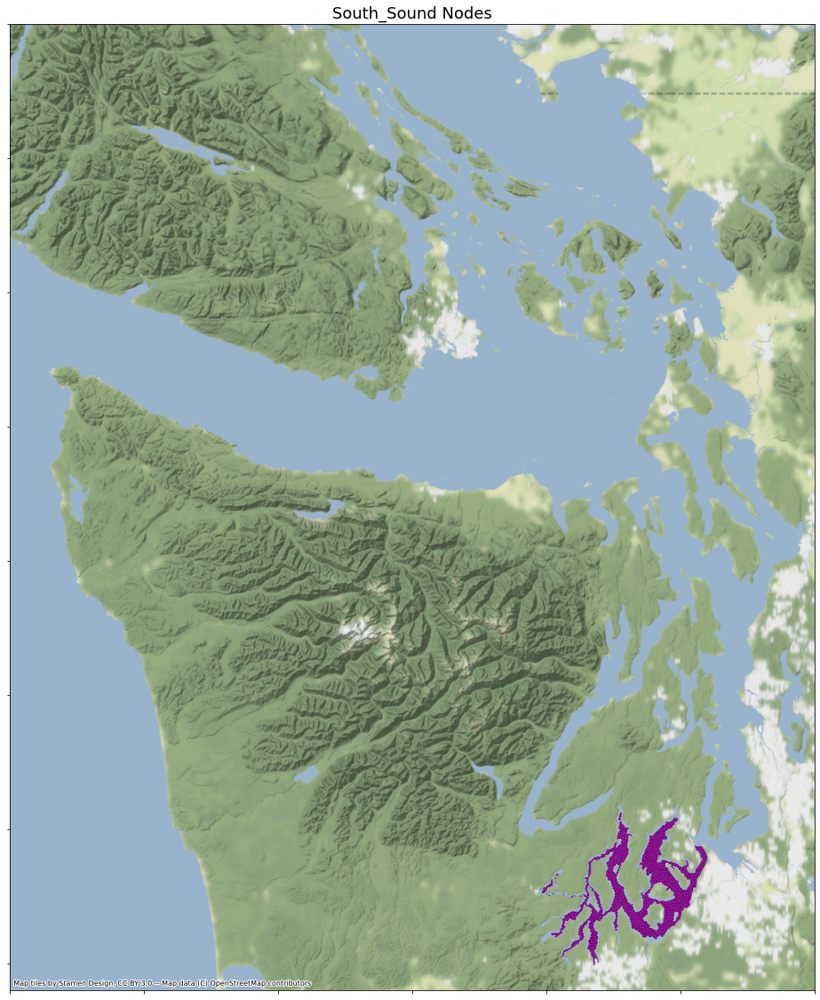

/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
/mmfs1/gscratch/ssmc/USRS/PSI/Rachael/.conda/envs/klone_jupyter/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Us

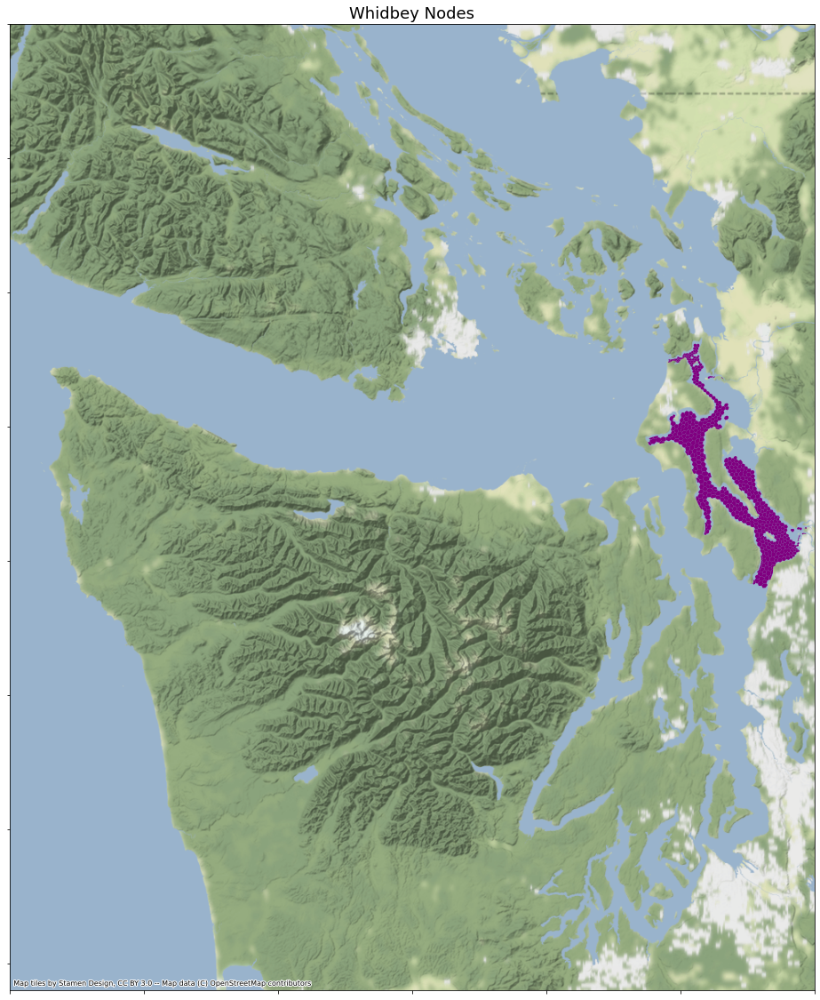

In [22]:
# plot differences for each run
for region in regions:
    fig, axs = plt.subplots(1,1, figsize = (20,20))   
    
    for region_extent in regions:
        gdf_region=gdf.loc[gdf['region_inf']==region_extent]
        gdf_region.plot('region_inf',ax=axs, color=ssm['region']['colors'][region_extent],alpha=0) 

    fig_title = f"{region} Nodes"
    gdf_region=gdf.loc[gdf['region_inf']==region]
    gdf_region.plot('region_inf',ax=axs, color='purple',label=region,legend=True) 
    cx.add_basemap(axs, crs=gdf.crs, 
       source=cx.providers.Stamen.TerrainBackground, 
       alpha=1) 
    axs.set_title(fig_title, fontsize=18)
    axs.set_xlim(-1.390e7, -1.360e7)
    axs.set_ylim(5.94e6, 6.3e6)
    axs.set_xticklabels('')
    axs.set_yticklabels('')
    output_file = output_directory/f"NodeMap_{region}_Purple.png"
    plt.savefig(output_file, bbox_inches='tight', format='png')
    plt.show()